# Active Learning in M-Regime

(Updated: 05/27/2020)

Description: Setup a general framework of carrying out active learning based on Fisher information in the M-regime

Items:
- Calculate the fisher information matrix given a particular query (initial configuration) using the current estimate of parameter values
- Calculate the fisher information matrix associated with a query distribution q(x)
- Formulate and solve the concerned SDP problem

Tests:
- Check if we can learn a known lattice using samples (M-regime) using the code currently (as in does this version of the code work?)
- Using the true values of the parameters, compute the Fisher information matrix of say a 3 node graphical model
- Compute the Fisher information matrix assuming an uniform distribution
- Playing it by the eye, can you cook up a query distribution for which the Fisher information matrix is better?

In [1]:
# Add locations of modules
push!(LOAD_PATH, "../src/")

4-element Array{String,1}:
 "@"      
 "@v#.#"  
 "@stdlib"
 "../src/"

In [2]:
#using Revise

In [3]:
import Random

In [4]:
using PyPlot
PyPlot.svg(true)

true

To resolve PyPlot and Revise issues: https://github.com/timholy/Revise.jl/issues/248

In [5]:
using LinearAlgebra

In [6]:
# For solving the SDP problems
using Convex

In [7]:
using SCS

In [8]:
## SCS successfully compiled so not using Mosek for the time being
using Mosek, MosekTools

### Test 1: Learning from M-regime samples

In [9]:
using GraphicalModelLearning

Random.seed!(10)

# Sample considering a simple factor graph
gm_true = FactorGraph([0.0 0.9 0.1; 0.9 0.0 0.1; 0.1 0.1 0.0])
#gm_true = FactorGraph([0.4 0.9 0.1; 0.9 0.4 0.1; 0.1 0.1 0.4])

┌ Info: assuming spin alphabet
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/models.jl:108


  (

alphabet: spin
vars: 3
terms: 3


1, 2) => 0.9
  (1, 3) => 0.1
  (2, 3) => 0.1


In [12]:
n_samples = 100000
samples_M, samples_M_mixed = gibbs_sampling(gm_true, n_samples, M_regime())

┌ Info: using Glauber dynamics v1 to generate M-regime samples
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/sampling.jl:403


([1684 3 … -1 1; 3551 1 … 1 1; … ; 541 1 … 1 1; 486 2 … -1 1], [19798 -1 -1 -1; 17330 -1 -1 1; … ; 6477 -1 1 1; 6614 1 -1 -1])

In [13]:
samples_M

48×8 Array{Int64,2}:
 1684  3  -1  -1  -1  -1  -1   1
 3551  1   1   1   1   1   1   1
 2516  3   1   1   1   1   1   1
  735  2   1   1  -1   1  -1  -1
  722  1   1   1  -1  -1   1  -1
  486  2  -1   1  -1  -1   1  -1
 2108  3   1  -1   1   1  -1   1
  701  1  -1  -1   1   1  -1   1
 3473  1  -1  -1   1  -1  -1   1
 2587  3  -1  -1   1  -1  -1  -1
 3325  2   1   1  -1   1   1  -1
 2128  3   1  -1  -1   1  -1   1
 2040  3  -1   1  -1  -1   1  -1
    ⋮                  ⋮        
 2057  3  -1   1   1  -1   1   1
  720  1  -1   1  -1  -1   1  -1
 2008  3  -1   1  -1  -1   1   1
 3493  1  -1   1  -1   1   1  -1
 3715  2  -1   1  -1  -1  -1  -1
 3474  2  -1   1   1  -1  -1   1
 2090  3   1  -1   1   1  -1  -1
 3504  2  -1  -1   1  -1  -1   1
 3472  1   1  -1   1  -1  -1   1
  695  2  -1   1   1  -1   1   1
  541  1  -1   1   1  -1   1   1
  486  2   1  -1   1   1  -1   1

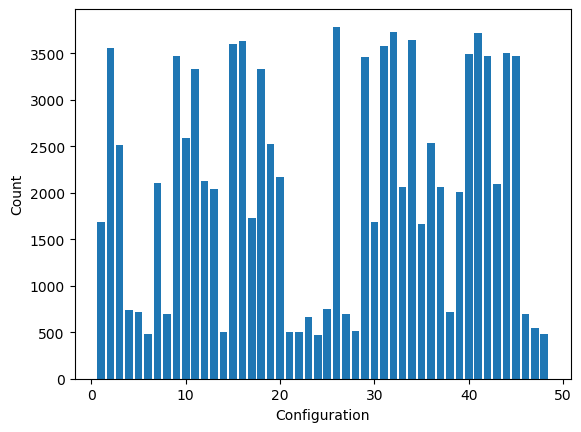

PyObject Text(24.0, 0.5, 'Count')

In [14]:
bar(1:length(samples_M[:,1]),samples_M[:,1])
xlabel("Configuration")
ylabel("Count")

In [15]:
learned1 = learn_glauber_dynamics(samples_M, RISE())

┌ Warning: `with_optimizer` is deprecated. Adapt the following example to update your code:
│ `with_optimizer(Ipopt.Optimizer, max_cpu_time=60.0)` becomes `optimizer_with_attributes(Ipopt.Optimizer, "max_cpu_time" => 60.0)`.
│   caller = ip:0x0
└ @ Core :-1
┌ Info: using JuMP for RISE to learn Glauber dynamics
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/GraphicalModelLearning.jl:368



******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit http://projects.coin-or.org/Ipopt
******************************************************************************



3×3 Array{Float64,2}:
 -0.0162624   0.887076    0.0981188 
  0.887076   -0.0178912   0.098624  
  0.0981188   0.098624   -0.00144937

In [15]:
typeof(learned1)

Array{Float64,2}

In [16]:
gm_true.terms

Dict{Tuple,Float64} with 3 entries:
  (1, 2) => 0.9
  (2, 3) => 0.1
  (1, 3) => 0.1

### Test 2: Compute Fisher information matrix of a particular query $I_x(\theta)$

In [11]:
# Ref: https://gist.github.com/tpapp/87e5675b87dbdd7a9a840e546eb20fae
function vec_triu_loop(adj_matrix::Array)
    m, n = size(adj_matrix)
    m == n || throw(error("not square"))
    len_theta = n*(n+1) ÷ 2
    
    # Array to hold values of adjacency matrix
    theta = ones(len_theta)
    
    # Create array of tuples to hold edges of corresponding values in theta
    edges_theta = Array{Tuple{Int, Int}}(undef, len_theta)
    
    k = 0
    @inbounds for i in 1:n
        for j in 1:i
            theta[k + j] = adj_matrix[j, i]
            edges_theta[k+j] = (j,i)
        end
        k += i
    end
    return len_theta, theta, edges_theta
end


vec_triu_loop (generic function with 1 method)

In [16]:
len_theta, theta, edges_theta = vec_triu_loop(learned1)

(6, [-0.0162624, 0.887076, -0.0178912, 0.0981188, 0.098624, -0.00144937], Tuple{Int64,Int64}[(1, 1), (1, 2), (2, 2), (1, 3), (2, 3), (3, 3)])

In [17]:
len_theta

6

In [18]:
theta

6-element Array{Float64,1}:
 -0.016262429232197572 
  0.8870764325332153   
 -0.01789120901514257  
  0.09811878864530513  
  0.09862396372776454  
 -0.0014493667201102597

In [19]:
edges_theta

6-element Array{Tuple{Int64,Int64},1}:
 (1, 1)
 (1, 2)
 (2, 2)
 (1, 3)
 (2, 3)
 (3, 3)

In [52]:
edges_theta[1]

(1, 1)

In [53]:
edges_theta[2]

(1, 2)

In [54]:
intersect(edges_theta[1],edges_theta[2])

1-element Array{Int64,1}:
 1

In [72]:
if !(isempty(intersect(edges_theta[1],edges_theta[3])))
    print("NOT EMPTY")
end

In [51]:
0.4*0.03/(0.4*0.03 + 0.3*0.97)

0.039603960396039604

In [60]:
A = zeros((len_theta, len_theta))

6×6 Array{Float64,2}:
 0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0

In [64]:
for i in 2:2
    print(i)
end

2

In [20]:
intersect(edges_theta[2],edges_theta[2])

2-element Array{Int64,1}:
 1
 2

In [21]:
function remove_node_from_edge(edge::Tuple, node::Integer)
    #=
    Functionality (1,2)\{2} = 1. Note that (1,1)\{1} = 1 as desired here.
    =#
    if edge[1] == node
        return edge[2]
    elseif edge[2] == node
        return edge[1]
    else
        return nothing
    end
end

remove_node_from_edge (generic function with 1 method)

In [23]:
remove_node_from_edge(edges_theta[2], 2)

1

In [13]:
tanh(-1)^2

0.5800256583859739

In [24]:
# Function to calculate the fisher information matrix for a given query
function fisher_information_query(adj_matrix::Array,theta::Array,edges_theta::Array,sigma::Array,len_theta::Integer,num_spins::Integer)
    #=
    Inputs: 
    adjacency matrix of the graphical model (estimated) -> corresponds to your theta
    sigma which is the particular query
    =#
    
    # Define Fisher Information matrix
    I_x = zeros((len_theta, len_theta))
    
    # Start filling up the upper triangle of I_x
    for a in 1:len_theta
        for b in a:len_theta
            # Get common node if exists
            set_common_nodes_temp = intersect(edges_theta[a],edges_theta[b])
            
            # if s is empty do nothing (i.e., I_x[a,b] = 0) else
            if !(isempty(set_common_nodes_temp))
                for s in set_common_nodes_temp
                    ind1 = remove_node_from_edge(edges_theta[a],s)
                    ind2 = remove_node_from_edge(edges_theta[b],s)

                    # set shared spin s to 1 as A_s = \sum_{u in ∂s} J_{su} σ_u + J_{ss}
                    sigma_temp = copy(sigma)
                    sigma_temp[s] = 1
                    A_s = sum(sigma_temp[i]*adj_matrix[s,i] for i=1:num_spins)

                    # We pick from sigma_temp instead of sigma for scenarios such as (1,1)∩(1,2)
                    I_x[a,b] += (1.0/num_spins)*sigma_temp[ind1]*sigma_temp[ind2]*(1.0 - tanh(A_s)^2)
                end
            end
        end
    end
    
    # Now copy over the upper triangle to lower triangle
    D = Diagonal(I_x)
    I_x_sut = I_x - D
    I_x = I_x_sut + transpose(I_x_sut) + D
    return I_x
end

fisher_information_query (generic function with 1 method)

In [25]:
# Let's test the fisher information function out
adj_matrix_true = [0.0 0.9 0.1; 0.9 0.0 0.0; 0.1 0.0 0.0]
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix_true)
sigma0 = [1,1,1]
I_x = fisher_information_query(adj_matrix_true,theta,edges_theta,sigma0,len_theta,3)

6×6 Array{Float64,2}:
 0.139991  0.139991  0.0       0.139991  0.0       0.0     
 0.139991  0.302297  0.162306  0.139991  0.162306  0.0     
 0.0       0.162306  0.162306  0.0       0.162306  0.0     
 0.139991  0.139991  0.0       0.470014  0.330022  0.330022
 0.0       0.162306  0.162306  0.330022  0.492328  0.330022
 0.0       0.0       0.0       0.330022  0.330022  0.330022

In [16]:
intersect(edges_theta[1],edges_theta[1])[1]

1

In [124]:
# I need to somehow check the above calculations but seems so tedious at this point

### Test 3: Compute the Fisher information corresponding to a query distribution $I_q(\theta)$

In [26]:
# Function to calculate the fisher information matrix for a given query distribution
function fisher_information_query_distrn(adj_matrix::Array,theta::Array,edges_theta::Array,X_σ::Array,q_σ::Array,len_theta::Integer,num_spins::Integer)
    #=
    Inputs:
    X_σ is the set of queries we are considering
    q_σ is the query distribution over these queries
    =#
    
    # Make sure the given query distribution is a valid pdf
    #if sum(q_σ)!=1
    #    error("Given query distribution is not a valid pdf")
    #end
    
    I_q = zeros((len_theta, len_theta))
    for ind_σ=1:length(X_σ)
        sigma0 = 2*digits(X_σ[ind_σ], base=2, pad=num_spins).-1
        I_q += q_σ[ind_σ]*fisher_information_query(adj_matrix,theta,edges_theta,sigma0,len_theta,num_spins)
    end
    
    return I_q
end

fisher_information_query_distrn (generic function with 1 method)

In [18]:
# Create X_σ
config_number = 2^3   #2^num_spins
X_σ = [config for config=0:(config_number-1)]

# Create the uniform distribution
p_U = (1/config_number)*ones(config_number)

8-element Array{Float64,1}:
 0.125
 0.125
 0.125
 0.125
 0.125
 0.125
 0.125
 0.125

In [20]:
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix_true)

(6, [0.4, 0.5, 0.0, -0.5, -0.5, 0.0], Tuple{Int64,Int64}[(1, 1), (1, 2), (2, 2), (1, 3), (2, 3), (3, 3)])

In [21]:
# Calculate the corresponding I_U
I_U = fisher_information_query_distrn(adj_matrix_true,theta,edges_theta,X_σ,p_U,len_theta,3)

6×6 Array{Float64,2}:
  0.219917   -0.0412854  0.0        0.0412854   0.0        0.0     
 -0.0412854   0.219917   0.0        0.0652956   0.0966709  0.0     
  0.0         0.0        0.236662   0.0         0.0        0.0     
  0.0412854   0.0652956  0.0        0.219917   -0.0966709  0.0     
  0.0         0.0966709  0.0       -0.0966709   0.236662   0.0     
  0.0         0.0        0.0        0.0         0.0        0.236662

In [22]:
length(X_σ)

8

In [23]:
# Get the Cramer-Rao bound of the matrix
crb_U = tr(inv(I_U))

44.0763840196425

In [33]:
# Let's check the distribution where q is 0 everywhere except for sigma = 0 or 8
q = zeros(config_number)
q[1] = 0.5
q[config_number] = 0.5

I_q = fisher_information_query_distrn(adj_matrix_true,theta,edges_theta,X_σ,q,len_theta,3)

6×6 Array{Float64,2}:
 0.139991  0.0       0.0       0.0       0.0       0.0     
 0.0       0.139991  0.0       0.139991  0.162306  0.0     
 0.0       0.0       0.162306  0.0       0.0       0.0     
 0.0       0.139991  0.0       0.139991  0.330022  0.0     
 0.0       0.162306  0.0       0.330022  0.162306  0.0     
 0.0       0.0       0.0       0.0       0.0       0.330022

In [34]:
# Get the Cramer-Rao bound of the matrix
crb_q = tr(inv(I_q))

39.14308289622688

### Test 4. Setup the SDP Problem

In [27]:
# Function to calculate the fisher information matrix for a given query distribution where q is a Variable (Convex.jl)
function fisher_information_query_distrn_obj(adj_matrix::Array,theta::Array,edges_theta::Array,X_σ::Array,q_σ::Variable,len_theta::Integer,num_spins::Integer)
    #=
    Inputs:
    X_σ is the set of queries we are considering
    q_σ is the query distribution over these queries
    =#
    
    I_q = zeros((len_theta, len_theta))
    for ind_σ=1:length(X_σ)
        sigma0 = 2*digits(X_σ[ind_σ], base=2, pad=num_spins).-1
        I_q += q_σ[ind_σ]*fisher_information_query(adj_matrix,theta,edges_theta,sigma0,len_theta,num_spins)
    end
    
    return I_q
end

fisher_information_query_distrn_obj (generic function with 1 method)

In [30]:
# Function to calculate the fisher information matrix for a given query distribution
function active_learning_M(adj_matrix::Array,X_σ::Array,num_spins::Integer)
    #=
    Inputs:
    adj_matrix is the current estimate of the parameters
    X_σ is the set of queries we are considering
    q_σ is the query distribution over these queries
    
    Ref: https://www.juliaopt.org/Convex.jl/dev/types/
    =#
    
    # Create the parameter vector: θ = [J_11, J_12, J_13, ..., J1n, ..., J_{i,i+1}, ..., J_nn]
    len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
    
    # Create the variables required for the SDP
    len_X = length(X_σ)
    q = Variable(len_X)  # query distribution
    t = Variable(len_theta)  # auxillary variables
    
    # Constraints for the query distribution
    constraints = [q>=0, q<=1, sum(q)==1]
    
    # Constraints involving the matrices
    U = 1.0*Matrix(I,len_theta,len_theta)
    for i=1:len_theta
        constraints += [fisher_information_query_distrn_obj(adj_matrix, theta, edges_theta, X_σ, q, len_theta, num_spins) U[i,:]; transpose(U[i,:]) t[i]] ⪰ 0
        #constraints += [t[i] transpose(U[i,:]); U[i,:] fisher_information_query_distrn_obj(adj_matrix, theta, edges_theta, X_σ, q, len_theta, num_spins)] ⪰ 0
    end

    # Solve the SDP
    problem = minimize(sum(t), constraints)
    #solve!(problem, SCS.Optimizer)
    solve!(problem, Mosek.Optimizer)
    
    return q.value
end

active_learning_M (generic function with 1 method)

In [62]:
# Test on a simple graphical model
spin_number = 3
#adj_matrix_true = [0.0 0.5 0.5; 0.5 0.0 0.5; 0.5 0.5 0.0]
#adj_matrix_true = [0.0 0.5 0.5; 0.5 0.0 0.0; 0.5 0.0 0.0]
#adj_matrix_true = [0.0 0.9 0.1; 0.9 0.0 0.0; 0.1 0.0 0.0]
adj_matrix_true = [0.0 0.9 0.1; 0.9 0.0 0.1; 0.1 0.1 0.0]
#adj_matrix_true = [0.4 0.9 0.1; 0.9 0.4 0.1; 0.1 0.1 0.4]

# Create X_σ
config_number = 2^spin_number
X_σ = [config for config=0:(config_number-1)]

8-element Array{Int64,1}:
 0
 1
 2
 3
 4
 5
 6
 7

In [63]:
@time q1 = active_learning_M(adj_matrix_true,X_σ,spin_number)

Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimization problem)
  Constraints            : 312             
  Cones                  : 0               
  Scalar variables       : 15              
  Matrix variables       : 6               
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.00            
Lin. dep.  - number                 : 0               
Presolve terminated. Time: 0.00    
Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimizat

8×1 Array{Float64,2}:
 0.012991931109892094
 0.1050018853485083  
 0.10500188534854321 
 0.2770042897769612  
 0.2770042897684585  
 0.10500188535705136 
 0.105001885357007   
 0.012991931101390184

In [64]:
sum(q1)

0.9999999831678117

In [65]:
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix_true)

(6, [0.0, 0.9, 0.0, 0.1, 0.1, 0.0], Tuple{Int64,Int64}[(1, 1), (1, 2), (2, 2), (1, 3), (2, 3), (3, 3)])

In [66]:
# CRB for this
q1 = q1/sum(q1)
I_q1 = fisher_information_query_distrn(adj_matrix_true,theta,edges_theta,X_σ,q1,len_theta,3)
crb_q1 = tr(inv(I_q1))

22.011369733944207

In [67]:
p_U = (1/config_number)*ones(config_number)
I_U = fisher_information_query_distrn(adj_matrix_true,theta,edges_theta,X_σ,p_U,len_theta,3)
crb_U = tr(inv(I_U))

22.49833385866174

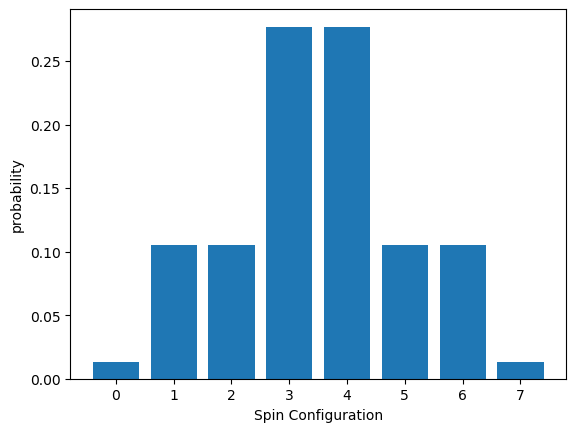

In [68]:
bar(X_σ,q1[:,1])
ylabel("probability")
xlabel("Spin Configuration")
savefig("p1.png")

In [69]:
s_configs = entropy_configs(adj_matrix_true,X_σ,3)

8-element Array{Float64,1}:
 0.1755259873161734 
 0.18889404504015156
 0.18889404504015156
 0.19736035471288638
 0.19736035471288638
 0.18889404504015156
 0.18889404504015156
 0.1755259873161734 

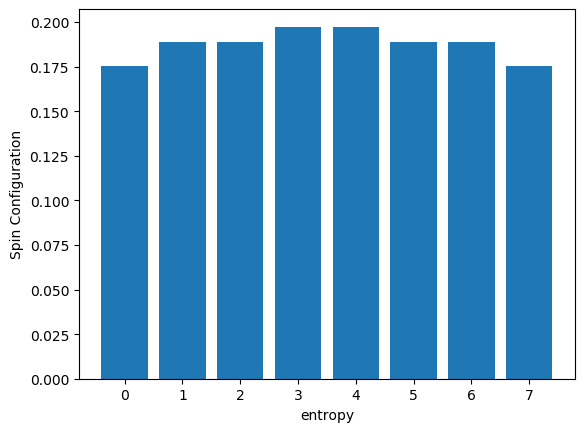

In [70]:
bar(X_σ,s_configs)
xlabel("entropy")
ylabel("Spin Configuration")
savefig("s1.png")

In [112]:
typeof(X_σ)

Array{Int64,1}

In [111]:
q1[:,1]

8-element Array{Float64,1}:
 0.14147547454307155
 0.11740235748921929
 0.12636935928673526
 0.11475280868097001
 0.11475280868098331
 0.12636935928673237
 0.11740235748921138
 0.14147547454307685

In [12]:
# Check 
X = Variable(2, 2)
y = Variable()
# X is a 2 x 2 variable, and y is scalar. X' + y promotes y to a 2 x 2 variable before adding them
p = minimize(norm(X) + y, 2 * X <= 1, X' + y >= 1, X >= 0, y >= 0)
#solve!(p, Mosek.Optimizer)
solve!(p, SCS.Optimizer)
println(round.(X.value, digits=2))
println(y.value)
p.optval

┌ Warning: `norm(x, p)` for matrices will in the future be equivalent to `norm(vec(x), p)`. Use `opnorm(x, p)` for the Julia 0.6 behavior of computing the operator norm for matrices.
│   caller = norm(::Variable) at norm.jl:12
└ @ Convex /Users/gogol/.julia/packages/Convex/v9Ehz/src/atoms/second_order_cone/norm.jl:12


[-0.0 -0.0; -0.0 -0.0]
1.0000000000193254
----------------------------------------------------------------------------
	SCS v2.1.1 - Splitting Conic Solver
	(c) Brendan O'Donoghue, Stanford University, 2012
----------------------------------------------------------------------------
Lin-sys: sparse-indirect, nnz in A = 28, CG tol ~ 1/iter^(2.00)
eps = 1.00e-05, alpha = 1.50, max_iters = 5000, normalize = 1, scale = 1.00
acceleration_lookback = 10, rho_x = 1.00e-03
Variables n = 7, constraints m = 30
Cones:	primal zero / dual free vars: 7
	linear vars: 13
	sd vars: 10, sd blks: 1
Setup time: 1.06e-04s
----------------------------------------------------------------------------
 Iter | pri res | dua res | rel gap | pri obj | dua obj | kap/tau | time (s)
----------------------------------------------------------------------------
     0| 2.39e+19  2.33e+19  1.00e+00 -2.45e+19  5.89e+19  3.49e+19  2.40e-04 
    38| 1.55e-11  3.09e-11  7.38e-12  1.00e+00  1.00e+00  8.82e-17  6.93e-04 
-----

1.0000000000227023

In [63]:
items  = [:Gold, :Silver, :Bronze]
values = [5.0, 3.0, 1.0]
weights = [2.0, 1.5, 0.3]

# Define a variable of size 3, each index representing an item
x = Variable(3)
p = maximize(x' * values, 0 <= x, x <= 1, x' * weights <= 3)
solve!(p, SCS.Optimizer)
println([items x.value])

MethodError: MethodError: no method matching solve!(::Problem, ::Type{SCS.Optimizer})
Closest candidates are:
  solve!(::Problem; warmstart, check_vexity, verbose) at /Users/gogol/.julia/packages/Convex/NBqGs/src/solution.jl:21
  solve!(::Problem, !Matched::MathProgBase.SolverInterface.AbstractMathProgSolver; kwargs...) at /Users/gogol/.julia/packages/Convex/NBqGs/src/solution.jl:12

In [64]:
using JuMP
items  = [:Gold, :Silver, :Bronze]
values = Dict(:Gold => 5.0,  :Silver => 3.0,  :Bronze => 1.0)
weight = Dict(:Gold => 2.0,  :Silver => 1.5,  :Bronze => 0.3)

model = Model(SCS.Optimizer)
@variable(model, 0 <= take[items] <= 1)  # Define a variable for each item
@objective(model, Max, sum(values[item] * take[item] for item in items))
@constraint(model, sum(weight[item] * take[item] for item in items) <= 3)
optimize!(model)
println(value.(take))
# 1-dimensional DenseAxisArray{Float64,1,...} with index sets:
#     Dimension 1, Symbol[:Gold, :Silver, :Bronze]
# And data, a 3-element Array{Float64,1}:
#  1.0000002002226671
#  0.4666659513182934
#  1.0000007732744878

MethodError: MethodError: no method matching Model(::Type{SCS.Optimizer})
Closest candidates are:
  Model(::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any, !Matched::Any) at /Users/gogol/.julia/packages/JuMP/ibcEh/src/JuMP.jl:146
  Model(; caching_mode, solver) at /Users/gogol/.julia/packages/JuMP/ibcEh/src/JuMP.jl:190
  Model(!Matched::Dict{MathOptInterface.VariableIndex,MathOptInterface.ConstraintIndex{MathOptInterface.SingleVariable,MathOptInterface.GreaterThan{Float64}}}, !Matched::Dict{MathOptInterface.VariableIndex,MathOptInterface.ConstraintIndex{MathOptInterface.SingleVariable,MathOptInterface.LessThan{Float64}}}, !Matched::Dict{MathOptInterface.VariableIndex,MathOptInterface.ConstraintIndex{MathOptInterface.SingleVariable,MathOptInterface.EqualTo{Float64}}}, !Matched::Dict{MathOptInterface.VariableIndex,MathOptInterface.ConstraintIndex{MathOptInterface.SingleVariable,MathOptInterface.Integer}}, !Matched::Dict{MathOptInterface.VariableIndex,MathOptInterface.ConstraintIndex{MathOptInterface.SingleVariable,MathOptInterface.ZeroOne}}, !Matched::MathOptInterface.AbstractOptimizer, !Matched::Dict{MathOptInterface.ConstraintIndex,AbstractShape}, !Matched::Set{Any}, !Matched::Any, !Matched::Any, !Matched::Dict{Symbol,Any}, !Matched::Int64, !Matched::Dict{Symbol,Any}) at /Users/gogol/.julia/packages/JuMP/ibcEh/src/JuMP.jl:146
  ...

## Applications

### Example 1. Check if it really works for maybe a lattice

How would I actually do this? So I would need to carry out a bunch of runs and check the empirical probability of reconstruction. Similar to Fig 2 in Lokhov. Maybe consider a spin glass model on the ferromagnetic lattice with antiferromagnetic strength where the number of samples to learn from T-regime is also on the smaller side so you can compare T-regime, M-regime and M-regime with active learning.

In [34]:
using Printf
using SparseArrays

In [35]:
# Parameters
n = 16 #number of spins
α = 0.4
β = 2.0

2.0

In [36]:
@printf("%f %F %f %F\n", Inf, Inf, NaN, NaN)

Inf Inf NaN NaN


In [37]:
include("beta_scaling.jl")

get_hessian_value_glauber_dynamics (generic function with 1 method)

In [149]:
# build graphical model
FLAG_weak_impurity = true
adj_matrix, struct_adj_matrix = ferro_lattice(n,α,β,FLAG_weak_impurity)

([0.0 2.0 … 0.0 0.0; 2.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 2.0; 0.0 0.0 … 2.0 0.0], [0.0 1.0 … 0.0 0.0; 1.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 1.0; 0.0 0.0 … 1.0 0.0])

In [150]:
adj_matrix

16×16 Array{Float64,2}:
 0.0  2.0   0.0   2.0  2.0  0.0  0.0  …  0.0  0.0  0.0  2.0  0.0  0.0  0.0
 2.0  0.0   2.0   0.0  0.0  2.0  0.0     0.0  0.0  0.0  0.0  2.0  0.0  0.0
 0.0  2.0   0.0  -0.4  0.0  0.0  2.0     0.0  0.0  0.0  0.0  0.0  2.0  0.0
 2.0  0.0  -0.4   0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  2.0
 2.0  0.0   0.0   0.0  0.0  2.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  2.0   0.0   0.0  2.0  0.0  2.0  …  2.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0   2.0   0.0  0.0  2.0  0.0     0.0  2.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0   0.0   2.0  2.0  0.0  2.0     0.0  0.0  2.0  0.0  0.0  0.0  0.0
 0.0  0.0   0.0   0.0  2.0  0.0  0.0     2.0  0.0  2.0  2.0  0.0  0.0  0.0
 0.0  0.0   0.0   0.0  0.0  2.0  0.0     0.0  2.0  0.0  0.0  2.0  0.0  0.0
 0.0  0.0   0.0   0.0  0.0  0.0  2.0  …  2.0  0.0  2.0  0.0  0.0  2.0  0.0
 0.0  0.0   0.0   0.0  0.0  0.0  0.0     0.0  2.0  0.0  0.0  0.0  0.0  2.0
 2.0  0.0   0.0   0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  2.0  0.0  2.0
 

In [151]:
struct_adj_matrix

16×16 Array{Float64,2}:
 0.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0  …  0.0  0.0  0.0  1.0  0.0  0.0  0.0
 1.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  1.0  0.0  1.0  0.0  0.0  1.0  0.0     0.0  0.0  0.0  0.0  0.0  1.0  0.0
 1.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0     0.0  0.0  0.0  0.0  0.0  0.0  1.0
 1.0  0.0  0.0  0.0  0.0  1.0  0.0  1.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  …  1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  1.0  0.0  1.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0     1.0  0.0  1.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  1.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  …  1.0  0.0  1.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0     0.0  1.0  0.0  0.0  0.0  0.0  1.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 

In [38]:
# Let's try plotting this with GraphPlot.jl (https://github.com/JuliaGraphs/GraphPlot.jl)
using LightGraphs, GraphPlot

┌ Info: Precompiling GraphPlot [a2cc645c-3eea-5389-862e-a155d0052231]
└ @ Base loading.jl:1192


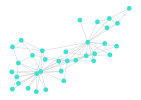

In [154]:
g = smallgraph(:karate)
gplot(g)

In [254]:
# Working towards replacing draw_periodic_lattice
m = Int(sqrt(n))
nodecount_plot = (m+2)^2

x = Array{Float64,1}(undef,nodecount_plot)
y = Array{Float64,1}(undef,nodecount_plot)

node_map_gm = zeros(m+2,m+2)
node_map_gm[1:nodecount_plot] = 1:nodecount_plot

for i=1:nodecount_plot
    y[i], x[i] = Tuple(findfirst(isequal(i),node_map_gm))
    if i in node_map_gm[:,1]
        x[i] += 0.3
    elseif i in node_map_gm[:,m+2]
        x[i] += -0.3
    end
end

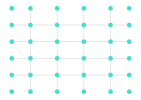

In [255]:
adj_matrix_junet, struct_adj_matrix_junet = non_periodic_lattice(adj_matrix,m+2,m+2)
g1 = SimpleGraph(struct_adj_matrix_junet)
gplot(g1, x, y)

In [252]:
reshape(y, (6,6))

6×6 Array{Float64,2}:
 1.0  1.3  1.3  1.3  1.3  1.0
 2.0  2.0  2.0  2.0  2.0  2.0
 3.0  3.0  3.0  3.0  3.0  3.0
 4.0  4.0  4.0  4.0  4.0  4.0
 5.0  5.0  5.0  5.0  5.0  5.0
 6.0  5.7  5.7  5.7  5.7  6.0

In [253]:
reshape(x, (6,6))

6×6 Array{Float64,2}:
 1.3  2.0  3.0  4.0  5.0  5.7
 1.3  2.0  3.0  4.0  5.0  5.7
 1.3  2.0  3.0  4.0  5.0  5.7
 1.3  2.0  3.0  4.0  5.0  5.7
 1.3  2.0  3.0  4.0  5.0  5.7
 1.3  2.0  3.0  4.0  5.0  5.7

In [236]:
node_map_gm

6×6 Array{Float64,2}:
 1.0   7.0  13.0  19.0  25.0  31.0
 2.0   8.0  14.0  20.0  26.0  32.0
 3.0   9.0  15.0  21.0  27.0  33.0
 4.0  10.0  16.0  22.0  28.0  34.0
 5.0  11.0  17.0  23.0  29.0  35.0
 6.0  12.0  18.0  24.0  30.0  36.0

In [245]:
a, b = Tuple(findfirst(isequal(23),node_map_gm))

(5, 4)

In [240]:
Base._ind2sub(node_map_gm,findfirst(isequal(23),node_map_gm)[1])

(5, 1)

In [221]:
nv(g1)

16

In [173]:
g2 = smallgraph(:karate)

{34, 78} undirected simple Int64 graph

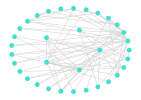

In [175]:
nlist = Vector{Vector{Int}}() # two shells
push!(nlist, collect(1:5)) # first shell
push!(nlist, collect(6:nv(g2))) # second shell
locs_x, locs_y = shell_layout(g2, nlist)
gplot(g2, locs_x, locs_y)

In [176]:
g2

{34, 78} undirected simple Int64 graph

In [177]:
nlist

2-element Array{Array{Int64,1},1}:
 [1, 2, 3, 4, 5]                                                                
 [6, 7, 8, 9, 10, 11, 12, 13, 14, 15  …  25, 26, 27, 28, 29, 30, 31, 32, 33, 34]

In [256]:
# Ok enough plotting, let's do some real stuff
gm_true = FactorGraph(adj_matrix)

┌ Info: assuming spin alphabet
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/models.jl:108


alphabet: spin
vars: 16
terms: 32


  (1, 2) => 2.0
  (1, 4) => 2.0
  (1, 5) => 2.0
  (1, 13) => 2.0
  (2, 3) => 2.0
  (2, 6) => 2.0
  (2, 14) => 2.0
  (3, 4) => -0.4
  (3, 7) => 2.0
  (3, 15) => 2.0
  (4, 8) => 2.0
  (4, 16) => 2.0
  (5, 6) => 2.0
  (5, 8) => 2.0
  (5, 9) => 2.0
  (6, 7) => 2.0
  (6, 10) => 2.0
  (7, 8) => 2.0
  (7, 11) => 2.0
  (8, 12) => 2.0
  (9, 10) => 2.0
  (9, 12) => 2.0
  (9, 13) => 2.0
  (10, 11) => 2.0
  (10, 14) => 2.0
  (11, 12) => 2.0
  (11, 15) => 2.0
  (12, 16) => 2.0
  (13, 14) => 2.0
  (13, 16) => 2.0
  (14, 15) => 2.0
  (15, 16) => 2.0


In [257]:
# What does the optimal query distribution look like for this example?
spin_number = 16

# Create X_σ
config_number = 2^spin_number
X_σ = [config for config=0:(config_number-1)]

65536-element Array{Int64,1}:
     0
     1
     2
     3
     4
     5
     6
     7
     8
     9
    10
    11
    12
     ⋮
 65524
 65525
 65526
 65527
 65528
 65529
 65530
 65531
 65532
 65533
 65534
 65535

In [258]:
q1 = active_learning_M(adj_matrix,X_σ,spin_number)

InterruptException: InterruptException:

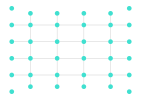

In [260]:
draw_periodic_lattice2(adj_matrix, 4, 4, α, β)

### SDP Solution for Lattice (n=9)

In [198]:
# The above graphical model was too big to solve for ... Let's try a smaller graph
n = 9
α = 0.4
β = 2.0
# build graphical model
FLAG_weak_impurity = true
adj_matrix, struct_adj_matrix = ferro_lattice(n,α,β,FLAG_weak_impurity)

([0.0 2.0 … 0.0 0.0; 2.0 0.0 … 2.0 0.0; … ; 0.0 2.0 … 0.0 2.0; 0.0 0.0 … 2.0 0.0], [0.0 1.0 … 0.0 0.0; 1.0 0.0 … 1.0 0.0; … ; 0.0 1.0 … 0.0 1.0; 0.0 0.0 … 1.0 0.0])

In [199]:
gm_true = FactorGraph(adj_matrix)

┌ Info: assuming spin alphabet
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/models.jl:108


alphabet: spin
vars: 9
terms: 18


  (1, 2) => 2.0
  (1, 3) => 2.0
  (1, 4) => -0.4
  (1, 7) => 2.0
  (2, 3) => 2.0
  (2, 5) => 2.0
  (2, 8) => 2.0
  (3, 6) => 2.0
  (3, 9) => 2.0
  (4, 5) => 2.0
  (4, 6) => 2.0
  (4, 7) => 2.0
  (5, 6) => 2.0
  (5, 8) => 2.0
  (6, 9) => 2.0
  (7, 8) => 2.0
  (7, 9) => 2.0
  (8, 9) => 2.0


In [200]:
# Create X_σ
config_number = 2^n
X_U = [config for config=0:(config_number -1)]
X_σ = [config for config=0:((config_number ÷ 2) -1)]  # subset of configs chosen has to be higher than the rank of the I_U
#X_σ = [config for config=0:(80-1)]  # subset of configs chosen has to be higher than the rank of the I_U
#X_σ = [X_σ; reverse((config_number-1)*ones(Int,length(X_σ)) - X_σ)]

256-element Array{Int64,1}:
   0
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
   ⋮
 244
 245
 246
 247
 248
 249
 250
 251
 252
 253
 254
 255

In [133]:
q1 = active_learning_M(adj_matrix,X_σ,spin_number)

Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimization problem)
  Constraints            : 95734           
  Cones                  : 0               
  Scalar variables       : 302             
  Matrix variables       : 45              
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.03            
Lin. dep.  - number                 : 0               
Presolve terminated. Time: 0.58    
Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimizat

256×1 Array{Float64,2}:
 2.259511729209714e-11 
 2.2865831229364325e-11
 2.3918404637159625e-11
 2.4458815551092077e-11
 6.309625380090389e-10 
 1.9689851480706297e-9 
 6.634209078452263e-10 
 4.164234032240231e-9  
 2.2865828918825206e-11
 2.312345410960669e-11 
 2.5142730174233414e-11
 2.5575513026646455e-11
 9.27723469541213e-10  
 ⋮                     
 2.5739208810599252e-11
 2.650939237221524e-11 
 2.3688265162355015e-11
 2.3608558464458545e-11
 0.0071708296358141315 
 9.352966633561745e-9  
 1.872095882726748e-8  
 9.114963142116957e-10 
 2.4555799513331275e-11
 2.5011152456097094e-11
 2.360847894189891e-11 
 2.2937783310218098e-11

In [174]:
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)

(45, [0.0, 2.0, 0.0, 2.0, 2.0, 0.0, -0.4, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 2.0, 2.0, 2.0, 0.0], Tuple{Int64,Int64}[(1, 1), (1, 2), (2, 2), (1, 3), (2, 3), (3, 3), (1, 4), (2, 4), (3, 4), (4, 4)  …  (8, 8), (1, 9), (2, 9), (3, 9), (4, 9), (5, 9), (6, 9), (7, 9), (8, 9), (9, 9)])

In [175]:
q1

256×1 Array{Float64,2}:
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 ⋮                    
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.007170832497640191 
 0.0                  
 1.8720966298666264e-8
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  

In [135]:
sum(q1)

0.9999999999947324

In [136]:
# CRB for this
# remove all the negative values
q1[q1 .< 0] .= 0
# remove all small values
eps_q = 1e-8
q1[q1 .< eps_q] .= 0

q1 = q1/sum(q1)
crb_q1 = crb_query_distrn(adj_matrix,X_σ,q1,spin_number)

18234.07314499343

In [142]:
q1

256×1 Array{Float64,2}:
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 ⋮                    
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.007170832497640191 
 0.0                  
 1.8720966298666264e-8
 0.0                  
 0.0                  
 0.0                  
 0.0                  
 0.0                  

In [155]:
q2 = [q1[:,1]; reverse(q1[:,1])]

512-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮  
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [156]:
q2 = q2/sum(q2)

512-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮  
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [176]:
q2

512-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮  
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [163]:
sum(q2)

1.0

In [179]:
crb_q2 = crb_query_distrn(adj_matrix,X_U,q2,n)

2331.1511491804745

In [185]:
I_q2 = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_U,q2,len_theta,n)

45×45 Array{Float64,2}:
  0.00881055   -5.24227e-20   0.0          …   0.0           0.0        
 -5.24227e-20   0.0496307    -3.45213e-19      0.0           0.0        
  0.0          -3.45213e-19   0.0408201        0.0           0.0        
  8.31025e-20  -0.00404531    0.0              0.0           0.0        
  0.0          -0.0126438     1.38951e-18      0.0           0.0        
  0.0           0.0           0.0          …   0.0           0.0        
  2.88924e-20  -0.00091487    0.0              0.0           0.0        
  0.0          -0.000156431  -3.45213e-19      0.0           0.0        
  0.0           0.0           0.0              0.0           0.0        
  0.0           0.0           0.0              0.0           0.0        
 -2.88924e-20   0.00145654    0.0          …   0.0           0.0        
  0.0          -0.0160047     3.45213e-19      0.0           0.0        
  0.0           0.0           0.0              0.0           0.0        
  ⋮                        

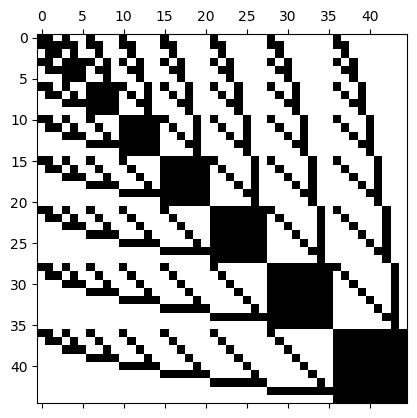

PyObject <matplotlib.image.AxesImage object at 0x184d1ced0>

In [186]:
spy(sparse(I_q2))

In [204]:
X_U = [config for config=0:(config_number -1)]
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
p_U = (1/config_number)*ones(config_number)
I_U = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_U,p_U,len_theta,n)
crb_U = tr(inv(I_U))

2660.5084271858113

In [183]:
rank(I_U)

45

In [48]:
size(I_U)

(45, 45)

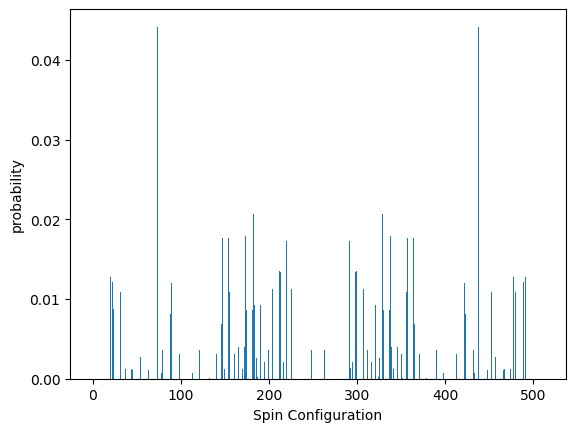

In [165]:
# What does the optimal query distribution look like for this example?
bar(X_U,q2)
xlabel("Spin Configuration")
ylabel("probability")
savefig("p1.png")

In [201]:
s_configs = entropy_configs(adj_matrix,X_U,n)

512-element Array{Float64,1}:
 6.778079940962523e-7  
 1.8099992588626462e-5 
 0.0003408452026510342 
 0.0017002843380745714 
 0.0003408452026510342 
 0.0017002843380745714 
 0.00012823122944391734
 0.0028296873156964616 
 1.8099992588626462e-5 
 0.0013775391280121637 
 0.0014702481802729244 
 0.004171704266525468  
 0.0014702481802729244 
 ⋮                     
 0.004171704266525468  
 0.0014702481802729244 
 0.0013775391280121637 
 1.8099992588626462e-5 
 0.0028296873156964616 
 0.00012823122944391734
 0.0017002843380745714 
 0.0003408452026510342 
 0.0017002843380745714 
 0.0003408452026510342 
 1.8099992588626462e-5 
 6.778079940962523e-7  

In [206]:
# What if I made the distribution proportional to the entropy of the system?
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
q_s = s_configs/sum(s_configs)
I_s = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_U,q_s,len_theta,n)
crb_s = tr(inv(I_s))

2491.3335552044387

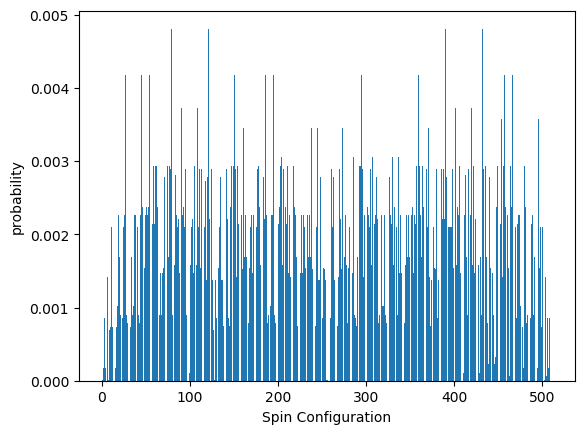

In [207]:
bar(X_U,q_s[:,1])
xlabel("Spin Configuration")
ylabel("probability")
savefig("ps1.png")

In [122]:
function crb_query_distrn(adj_matrix::Array, X_σ::Array, q::Array, spin_number::Integer)
    len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
    
    I_s = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,q,len_theta,spin_number)
    return tr(inv(I_s))
end

crb_query_distrn (generic function with 1 method)

In [150]:
adj_matrix

9×9 Array{Float64,2}:
  0.0  2.0  2.0  -0.4  0.0  0.0  2.0  0.0  0.0
  2.0  0.0  2.0   0.0  2.0  0.0  0.0  2.0  0.0
  2.0  2.0  0.0   0.0  0.0  2.0  0.0  0.0  2.0
 -0.4  0.0  0.0   0.0  2.0  2.0  2.0  0.0  0.0
  0.0  2.0  0.0   2.0  0.0  2.0  0.0  2.0  0.0
  0.0  0.0  2.0   2.0  2.0  0.0  0.0  0.0  2.0
  2.0  0.0  0.0   2.0  0.0  0.0  0.0  2.0  2.0
  0.0  2.0  0.0   0.0  2.0  0.0  2.0  0.0  2.0
  0.0  0.0  2.0   0.0  0.0  2.0  2.0  2.0  0.0

In [194]:
length(q2[q2 .> 0.0])

176

In [216]:
# helper function to get indices of the k largest values in an array
# More: https://discourse.julialang.org/t/what-is-julias-maxk-matlab-that-returns-the-indice-of-top-k-largest-values/14100/7
function maxk(a, k)
   b = partialsortperm(a, 1:k, rev=true)
   return b
end

maxk (generic function with 1 method)

In [235]:
# Returns n most uncertain spin configurations
function uncertainty_filtering(adj_matrix::Array, X::Array, num_spins::Integer)
    #=
    Inputs:
    adj_matrix is the adjacency matrix
    X is the set of spin configurations
    
    Outputs:
    X_uncertain: n most uncertain configurations
    idx_uncertain: indices where these occur
    =#
    
    # Fetch the size of the FI matrix
    len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
    
    # get entropy of the configurations
    s_configs = entropy_configs(adj_matrix,X,num_spins)
    
    # Choose the most uncertain configurations (number enough to ensure that FI matrix is full rank)
    n_uncertain = min(2*len_theta, length(X))
    idx_uncertain = maxk(s_configs,n_uncertain)
    X_uncertain = X[idx_uncertain]
    
    return X_uncertain, idx_uncertain
end

uncertainty_filtering (generic function with 1 method)

In [236]:
length(s_configs)

512

In [237]:
maxk(s_configs, 10)

10-element view(::Array{Int64,1}, 1:10) with eltype Int64:
  80
 122
 391
 433
  28
  46
  55
 152
 187
 196

In [223]:
X_σ

256-element Array{Int64,1}:
   0
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
   ⋮
 244
 245
 246
 247
 248
 249
 250
 251
 252
 253
 254
 255

In [238]:
X_filtered, idx_filtered = uncertainty_filtering(adj_matrix, X_σ, n)

([79, 121, 27, 45, 54, 151, 186, 195, 216, 91  …  44, 50, 52, 85, 92, 99, 106, 149, 156, 159], [80, 122, 28, 46, 55, 152, 187, 196, 217, 92  …  45, 51, 53, 86, 93, 100, 107, 150, 157, 160])

In [225]:
q_filtered = active_learning_M(adj_matrix,X_filtered,n)

Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimization problem)
  Constraints            : 95402           
  Cones                  : 0               
  Scalar variables       : 136             
  Matrix variables       : 45              
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.03            
Lin. dep.  - number                 : 0               
Presolve terminated. Time: 0.33    
Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimizat

90×1 Array{Float64,2}:
 0.00554027154530727   
 0.005540418456860568  
 1.0854778140899846e-11
 0.004658470222895409  
 0.00584095455498902   
 0.007125224538940158  
 0.0071253773387272585 
 0.004956610011133513  
 0.0049567892629256115 
 2.366380634203593e-10 
 0.029017854742961487  
 1.9684252380029513e-10
 1.9823499002889644e-10
 ⋮                     
 0.0006347996020807093 
 2.6501048052518426e-9 
 0.0006347825374025586 
 0.09981702845188682   
 3.258507836490746e-9  
 0.0015176359430146308 
 6.051987987145136e-11 
 6.073443747628071e-11 
 0.001517721700816142  
 6.068847746826916e-8  
 7.105615835935849e-11 
 1.6065777632248903e-10

In [226]:
# Remove the small values
q_filtered[q_filtered .< 0] .= 0
# remove all small values
eps_q = 1e-8
q_filtered[q_filtered .< eps_q] .= 0

q_filtered = q_filtered/sum(q_filtered)

90×1 Array{Float64,2}:
 0.005540271694903598 
 0.0055404186064608625
 0.0                  
 0.00465847034868167  
 0.005840954712704277 
 0.00712522473133279  
 0.007125377531124017 
 0.004956610144970032 
 0.0049567893967669705
 0.0                  
 0.029017855526490683 
 0.0                  
 0.0                  
 ⋮                    
 0.0006347996192213293
 0.0                  
 0.0006347825545427179
 0.09981703114710867  
 0.0                  
 0.0015176359839932656
 0.0                  
 0.0                  
 0.0015177217417970924
 6.06884791069566e-8  
 0.0                  
 0.0                  

In [227]:
length(q_filtered[q_filtered .> 0])

45

In [239]:
# Put it back in full support
q1_AL_w_UF = zeros(length(X_σ))
q1_AL_w_UF[idx_filtered] = q_filtered

90×1 Array{Float64,2}:
 0.005540271694903598 
 0.0055404186064608625
 0.0                  
 0.00465847034868167  
 0.005840954712704277 
 0.00712522473133279  
 0.007125377531124017 
 0.004956610144970032 
 0.0049567893967669705
 0.0                  
 0.029017855526490683 
 0.0                  
 0.0                  
 ⋮                    
 0.0006347996192213293
 0.0                  
 0.0006347825545427179
 0.09981703114710867  
 0.0                  
 0.0015176359839932656
 0.0                  
 0.0                  
 0.0015177217417970924
 6.06884791069566e-8  
 0.0                  
 0.0                  

In [241]:
q2_AL_w_UF = [q1_AL_w_UF; reverse(q1_AL_w_UF)]

512-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮  
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [244]:
sum(q2_AL_w_UF)

1.9999999999999996

In [245]:
q2_AL_w_UF = q2_AL_w_UF/sum(q2_AL_w_UF)

512-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮  
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [246]:
# CRB for this
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
I_q2_AL_w_UF = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_U,q2_AL_w_UF,len_theta,n)
crb_s = tr(inv(I_q2_AL_w_UF))

2582.448271968933

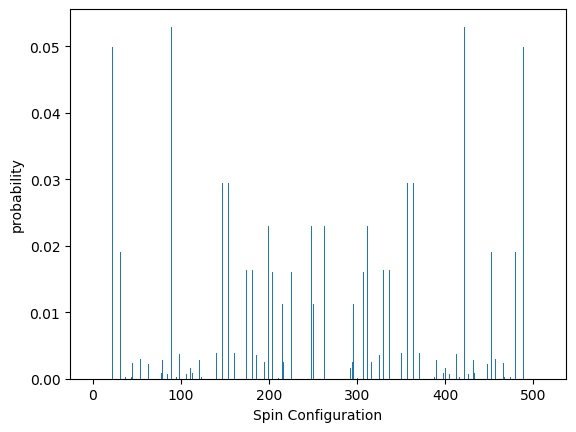

In [247]:
bar(X_U,q2_AL_w_UF[:,1])
xlabel("Spin Configuration")
ylabel("probability")
savefig("ps2.png")

In [260]:
q1_sparse = sparse(q1)

256×1 SparseMatrixCSC{Float64,Int64} with 88 stored entries:
  [16 ,   1]  =  2.49137e-8
  [21 ,   1]  =  0.0254367
  [23 ,   1]  =  0.0242756
  [24 ,   1]  =  0.017488
  [30 ,   1]  =  2.26865e-5
  [32 ,   1]  =  0.0218512
  [35 ,   1]  =  0.0254367
  [38 ,   1]  =  0.00250294
  [44 ,   1]  =  2.27004e-5
  [45 ,   1]  =  0.00250294
  [46 ,   1]  =  0.00224634
  [51 ,   1]  =  0.0242756
  ⋮
  [214,   1]  =  0.0268439
  [216,   1]  =  1.87116e-8
  [217,   1]  =  0.00422708
  [220,   1]  =  0.00273169
  [221,   1]  =  0.0344963
  [226,   1]  =  0.0224514
  [227,   1]  =  0.0270908
  [228,   1]  =  0.0344963
  [235,   1]  =  0.0268439
  [242,   1]  =  1.38434e-8
  [249,   1]  =  0.00717083
  [251,   1]  =  1.8721e-8

In [266]:
sort(idx_filtered)

90-element Array{Int64,1}:
  16
  20
  23
  27
  28
  31
  32
  38
  39
  45
  46
  47
  48
   ⋮
 212
 216
 217
 218
 219
 220
 226
 239
 242
 246
 249
 251

In [262]:
q1_f_sparse = sparse(q1_AL_w_UF)

256-element SparseVector{Float64,Int64} with 45 stored entries:
  [23 ]  =  0.0998174
  [32 ]  =  0.0381204
  [38 ]  =  0.0006348
  [45 ]  =  0.000634783
  [46 ]  =  0.00465847
  [51 ]  =  0.099817
  [55 ]  =  0.00584095
  [60 ]  =  0.0381196
  [64 ]  =  0.00431043
  [76 ]  =  0.105876
         ⋮
  [200]  =  0.0460011
  [205]  =  0.0320244
  [210]  =  1.4764e-8
  [212]  =  0.000334673
  [216]  =  0.0224569
  [217]  =  0.00495679
  [219]  =  0.000334572
  [220]  =  0.00327344
  [226]  =  0.0320247
  [249]  =  0.0459999
  [251]  =  0.0224569

### Smaller Examples

In [195]:
using LinearAlgebra, SparseArrays, Printf

In [87]:
using LightGraphs

In [73]:
include("beta_scaling.jl")

get_hessian_value_glauber_dynamics (generic function with 1 method)

In [39]:
# Function to calculate the entropy of a given query
function entropy_query(adj_matrix::Array,sigma::Array,num_spins::Integer)
    #=
    Inputs: 
    adjacency matrix of the graphical model (estimated) -> corresponds to your theta
    sigma which is the particular query
    =#
    
    # Define entropy
    entropy = 0.0
    
    # Start filling up the upper triangle of I_x
    for k in 1:num_spins
        sigma_temp = copy(sigma)
        sigma_temp[k] = 1
        A_k = sum(sigma_temp[i]*adj_matrix[k,i] for i=1:num_spins)
        
        entropy += log(2*cosh(A_k)) - A_k*tanh(A_k)
    end

    return entropy
end

entropy_query (generic function with 1 method)

In [40]:
# Function to calculate the entropy of given query configurations
function entropy_configs(adj_matrix::Array,X_σ::Array,num_spins::Integer)
    #=
    Inputs: 
    adjacency matrix of the graphical model (estimated) -> corresponds to your theta
    sigma which is the particular query
    =#
    
    # Define entropy
    entropy_configs = zeros(length(X_σ))
    
    for i in 1:length(X_σ)
        sigma_temp = 2*digits(X_σ[i], base=2, pad=num_spins) .- 1
        entropy_configs[i] = (1/length(X_σ))*entropy_query(adj_matrix, sigma_temp, num_spins)
    end

    return entropy_configs
end

entropy_configs (generic function with 1 method)

In [167]:
# Let's look at a bigger lattice
n = 16
α = 0.4
β = 2.0
# build graphical model
FLAG_weak_impurity = true
adj_matrix, struct_adj_matrix = ferro_lattice(n,α,β,FLAG_weak_impurity)

([0.0 2.0 … 0.0 0.0; 2.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 2.0; 0.0 0.0 … 2.0 0.0], [0.0 1.0 … 0.0 0.0; 1.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 1.0; 0.0 0.0 … 1.0 0.0])

In [168]:
# Create X_σ
spin_number = n
config_number = 2^spin_number
X_U = [config for config=0:(config_number-1)]
X_σ = [config for config=0:((config_number ÷ 2)-1)]

32768-element Array{Int64,1}:
     0
     1
     2
     3
     4
     5
     6
     7
     8
     9
    10
    11
    12
     ⋮
 32756
 32757
 32758
 32759
 32760
 32761
 32762
 32763
 32764
 32765
 32766
 32767

In [169]:
s_configs = entropy_configs(adj_matrix,X_σ,n)

32768-element Array{Float64,1}:
 1.099943168063897e-8 
 5.326114973195294e-6 
 5.326114973195294e-6 
 1.064123051470995e-5 
 2.832210659701735e-7 
 2.2973036498537328e-5
 5.598336607484829e-6 
 2.8288152040051983e-5
 2.832210659701735e-7 
 5.598336607484829e-6 
 2.2973036498537328e-5
 2.8288152040051983e-5
 5.55442700259708e-7  
 ⋮                    
 4.593507356539402e-5 
 2.8288152040051983e-5
 2.3245258132826863e-5
 5.598336607484829e-6 
 7.410057506996356e-5 
 2.8288152040051983e-5
 6.878545952844889e-5 
 2.2973036498537328e-5
 2.8288152040051983e-5
 1.064123051470995e-5 
 2.2973036498537328e-5
 5.326114973195294e-6 

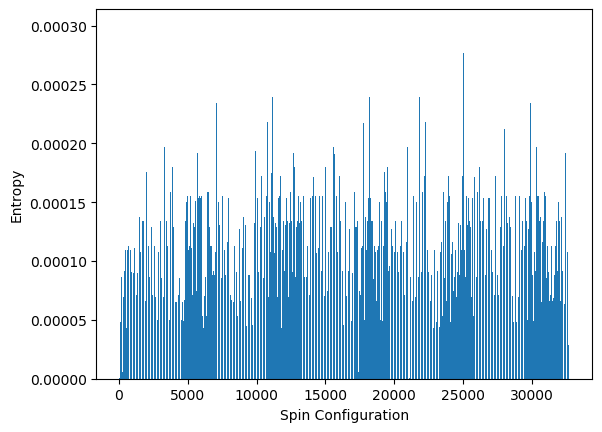

PyObject Text(0.5, 24.0, 'Spin Configuration')

In [170]:
bar(X_σ,s_configs)
ylabel("Entropy")
xlabel("Spin Configuration")

In [171]:
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
p_U = (1/config_number)*ones(config_number)
I_U = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,p_U,len_theta,spin_number)
crb_U = tr(inv(I_U))

InterruptException: InterruptException:

In [83]:
# What if I made the distribution proportional to the entropy of the system?
q_s = s_configs/sum(s_configs)
I_s = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,q_s,len_theta,spin_number)
crb_s = tr(inv(I_s))

2491.3335552044387

In [84]:
rank(I_s)

45

In [82]:
sum(q_s)

0.9999999999999999

In [85]:
q1 = zeros(config_number)
q1[1] = 0.4
q1[2] = 0.1
q1[config_number-1] = 0.1
q1[config_number] = 0.4
I_q1 = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,q1,len_theta,spin_number)
crb_q1 = tr(inv(I_q1))

1.3253542148524381e23

In [88]:
n = 6
d = 3
α = 0.4
β = 1.4
FLAG_weak_impurity = true
adj_matrix, struct_adj_matrix = ferro_random_regular_model(n,d,α,β,FLAG_weak_impurity)

([0.0 1.4 … 1.4 0.0; 1.4 0.0 … 0.0 1.4; … ; 1.4 0.0 … 0.0 1.4; 0.0 1.4 … 1.4 0.0], [0 1 … 1 0; 1 0 … 0 1; … ; 1 0 … 0 1; 0 1 … 1 0])

In [89]:
gm_true = FactorGraph(adj_matrix)

┌ Info: assuming spin alphabet
└ @ GraphicalModelLearning /Users/gogol/Dropbox (Personal)/Research/LANL/Code/GML_Glauber_Dynamics.jl/src/models.jl:108


alphabet: spin
vars: 6
terms: 9


  (1, 2) => 1.4
  (1, 3) => 1.4
  (1, 5) => 1.4
  (2, 3) => 1.4
  (2, 6) => 1.4
  (3, 4) => -0.4
  (4, 5) => 1.4
  (4, 6) => 1.4
  (5, 6) => 1.4


In [96]:
# What does the optimal query distribution look like for this example?
spin_number = n

# Create X_σ
config_number = 2^spin_number
X_σ = [config for config=0:((config_number ÷ 2) -1)]  # subset of configs chosen has to be higher than the rank of the I_U
#X_σ = [config for config=0:(config_number - 1)]  # subset of configs chosen has to be higher than the rank of the I_U

32-element Array{Int64,1}:
  0
  1
  2
  3
  4
  5
  6
  7
  8
  9
 10
 11
 12
  ⋮
 20
 21
 22
 23
 24
 25
 26
 27
 28
 29
 30
 31

In [97]:
q1 = active_learning_M(adj_matrix,X_σ,spin_number)

Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimization problem)
  Constraints            : 10230           
  Cones                  : 0               
  Scalar variables       : 54              
  Matrix variables       : 21              
  Integer variables      : 0               

Optimizer started.
Presolve started.
Linear dependency checker started.
Linear dependency checker terminated.
Eliminator started.
Freed constraints in eliminator : 0
Eliminator terminated.
Eliminator - tries                  : 1                 time                   : 0.00            
Lin. dep.  - tries                  : 1                 time                   : 0.00            
Lin. dep.  - number                 : 0               
Presolve terminated. Time: 0.02    
Problem
  Name                   :                 
  Objective sense        : min             
  Type                   : CONIC (conic optimizat

32×1 Array{Float64,2}:
 -8.379313930964136e-14 
 -5.688810274908983e-14 
  1.7415241691324454e-12
  0.05915109719740599   
 -7.438826041960044e-14 
 -3.6989691472523404e-14
  0.07649515712382467   
  0.024265327864828757  
  0.05783841044751541   
  2.4152027475072457e-10
  0.03101253758306326   
  0.08078400205635361   
  0.014711296679356235  
  ⋮                     
  0.021563172012254078  
  0.034931240257310335  
  3.532972619826896e-11 
  0.0803432981074932    
  0.0011185863232075085 
  0.05628725785662572   
 -2.309800555488269e-14 
 -5.4851866351535004e-14
  0.08742537158465759   
  0.025650739827403034  
 -3.744435924441297e-14 
 -7.210048245823118e-14 

In [98]:
# CRB for this
# remove all the negative values
q1[q1 .< 0] .= 0
# remove all small values
eps_q = 1e-6
q1[q1 .< eps_q] .= 0

q1 = q1/sum(q1)
I_q1 = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,q1,len_theta,spin_number)
crb_q1 = tr(inv(I_q1))

755.3962457804638

In [166]:
p_U = (1/config_number)*ones(config_number)
I_U = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,p_U,len_theta,spin_number)
crb_U = tr(inv(I_U))

1646.071746256877

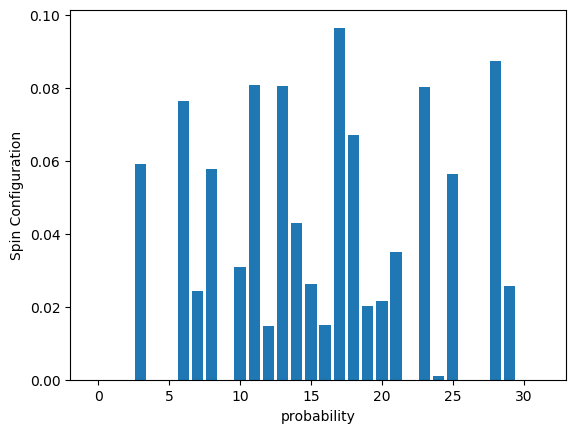

In [99]:
bar(X_σ,q1[:,1])
xlabel("probability")
ylabel("Spin Configuration")
savefig("p1.png")

In [91]:
s_configs = entropy_configs(adj_matrix,X_σ,n)

64-element Array{Float64,1}:
 0.0016125942094992879
 0.017340705208738642 
 0.017340705208738642 
 0.01465335920968458  
 0.007858758713136675 
 0.020189569464102077 
 0.020189569464102077 
 0.014104923216774062 
 0.007858758713136675 
 0.020738005457012595 
 0.020738005457012595 
 0.015201795202595098 
 0.014104923216774062 
 ⋮                    
 0.015201795202595098 
 0.020738005457012595 
 0.020738005457012595 
 0.007858758713136675 
 0.014104923216774062 
 0.020189569464102077 
 0.020189569464102077 
 0.007858758713136675 
 0.01465335920968458  
 0.017340705208738642 
 0.017340705208738642 
 0.0016125942094992879

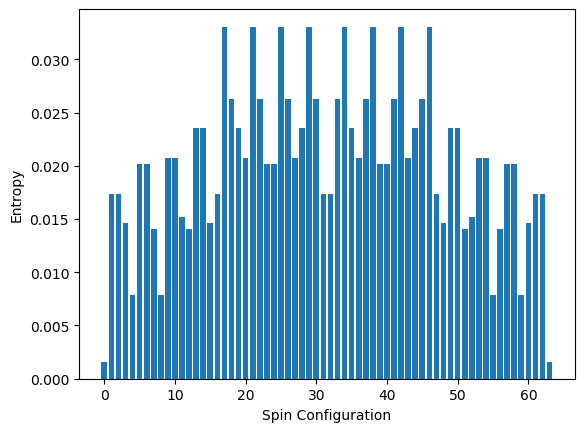

PyObject Text(0.5, 24.0, 'Spin Configuration')

In [92]:
bar(X_σ,s_configs)
ylabel("Entropy")
xlabel("Spin Configuration")

In [93]:
len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
p_U = (1/config_number)*ones(config_number)
I_U = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,p_U,len_theta,spin_number)
crb_U = tr(inv(I_U))

446.6638782161683

In [94]:
# What if I made the distribution proportional to the entropy of the system?
q_s = s_configs/sum(s_configs)
I_s = fisher_information_query_distrn(adj_matrix,theta,edges_theta,X_σ,q_s,len_theta,spin_number)
crb_s = tr(inv(I_s))

420.6330937287714

In [95]:
rank(I_s)

21

### Solving with IPopt and JuMP

In [71]:
using LinearAlgebra

In [72]:
using JuMP

In [73]:
using Ipopt

In [74]:
# default values
NLP() = NLP(with_optimizer(Ipopt.Optimizer, print_level=0))

NLP

In [78]:
# Function to calculate the fisher information matrix for a given query distribution
function crb_query_distrn(adj_matrix::Array,theta::Array,edges_theta::Array,X_σ::Array,q_σ::Array,len_theta::Integer,num_spins::Integer)
    #=
    Inputs:
    X_σ is the set of queries we are considering
    q_σ is the query distribution over these queries
    =#
    
    # Make sure the given query distribution is a valid pdf
    #if sum(q_σ)!=1
    #    error("Given query distribution is not a valid pdf")
    #end
    
    I_q = zeros((len_theta, len_theta))
    for ind_σ=1:length(X_σ)
        sigma0 = 2*digits(X_σ[ind_σ], base=2, pad=num_spins).-1
        I_q += q_σ[ind_σ]*fisher_information_query(adj_matrix,theta,edges_theta,sigma0,len_theta,num_spins)
    end
    
    return tr(inv(I_q))
end

crb_query_distrn (generic function with 1 method)

In [79]:
function active_learning_M_JUMP(adj_matrix::Array,X_σ::Array,num_spins::Integer)
    #=
    Inputs:
    adj_matrix is the current estimate of the parameters
    X_σ is the set of queries we are considering
    q_σ is the query distribution over these queries
    
    Ref: https://www.juliaopt.org/Convex.jl/dev/types/
    =#
    
    # Create the parameter vector: θ = [J_11, J_12, J_13, ..., J1n, ..., J_{i,i+1}, ..., J_nn]
    len_theta, theta, edges_theta = vec_triu_loop(adj_matrix)
    
    # Create the variables required
    len_X = length(X_σ)
    
    model = Model(NLP(with_optimizer(Ipopt.Optimizer, print_level=0)).solver)
    @variable(model, q[1:len_X]) # query distribution
    
    @NLobjective(model, Min, 
        crb_query_distrn(adj_matrix, theta, edges_theta, X_σ, q, len_theta, num_spins) )

    # Constraints for the query distribution
    for j=1:len_X
        @constraint(model, q[j] >= 0)
        @constraint(model, q[j] <= 1)
    end
    
    @constraint(model, sum(q) == 1)
    
    JuMP.optimize!(model)
    @assert JuMP.termination_status(model) == JuMP.MOI.LOCALLY_SOLVED
    
    return JuMP.value.(q)
end

active_learning_M_JUMP (generic function with 1 method)

In [80]:
# Run on a three node example as before
spin_number = 3
adj_matrix_true = [0.0 0.5 0.5; 0.5 0.0 0.5; 0.5 0.5 0.0]
#adj_matrix_true = [0.0 0.5 0.5; 0.5 0.0 0.0; 0.5 0.0 0.0]
#adj_matrix_true = [0.0 0.9 0.1; 0.9 0.0 0.0; 0.1 0.0 0.0]
#adj_matrix_true = [0.0 0.9 0.1; 0.9 0.0 0.1; 0.1 0.1 0.0]
#adj_matrix_true = [0.4 0.9 0.1; 0.9 0.4 0.1; 0.1 0.1 0.4]

# Create X_σ
config_number = 2^spin_number
X_σ = [config for config=0:(config_number-1)]

8-element Array{Int64,1}:
 0
 1
 2
 3
 4
 5
 6
 7

In [81]:
q1 = active_learning_M_JUMP(adj_matrix_true,X_σ,spin_number)

ErrorException: Unrecognized function "crb_query_distrn" used in nonlinear expression.

In [ ]:
# CRB for this
q1 = q1/sum(q1)
I_q1 = fisher_information_query_distrn(adj_matrix_true,theta,edges_theta,X_σ,q1,len_theta,3)
crb_q1 = tr(inv(I_q1))

In [ ]:
bar(X_σ,q1[:,1])
xlabel("probability")
ylabel("Spin Configuration")
savefig("p1.png")

### Example 2. Check how it changes the scaling

Would it be enough to do it for one regime e.g. Figure E using both RPLE and RISE.

In [9]:
function solve_exp_system(β_array::Array,M_array::Array,d_max::Integer)
    # Set up the least squares problem
    b = log.(M_array)
    A = ones(length(β_array),2)
    for i=1:length(β_array)
        A[i,2] = β_array[i]*d_max
    end
    x = A\b
    return x
end

solve_exp_system (generic function with 1 method)

In [10]:
β_array = [0.4+0.1*i for i=0:6]

M_array1 = [37950,178850,892850,4688500]
M_array2 = [11550,43950,154750,890050,4429400,34203650,239576250]

d_max = 4

x1 = solve_exp_system(β_array[2:5],M_array1,d_max)
x2 = solve_exp_system(β_array[2:7],M_array2[2:7],d_max)

2-element Array{Float64,1}:
 1.6819250739363967
 4.3441031377696016

In [11]:
x1

2-element Array{Float64,1}:
 2.4877979016495813
 4.01441663974805  

In [12]:
x2

2-element Array{Float64,1}:
 1.6819250739363967
 4.3441031377696016

In [14]:
# Compare against convex.jl solution

# Set up the least squares problem
M_array_temp2 = M_array2[2:7]
β_array_temp = β_array[2:7]

b = log.(M_array_temp2)
A = ones(length(β_array_temp),2)
for i=1:length(β_array_temp)
    A[i,2] = β_array_temp[i]*d_max
end

x = Variable(2)
problem = minimize(sumsquares(A * x - b), [x >= 0])

minimize
└─ qol_elem (convex; positive)
   ├─ norm2 (convex; positive)
   │  └─ + (affine; real)
   │     ├─ …
   │     └─ …
   └─ [1.0]
subject to
└─ >= constraint (affine)
   ├─ 2-element real variable (id: 444…652)
   └─ 0

status: `solve!` not called yet

In [15]:
solve!(problem, () -> SCS.Optimizer(verbose=false))

In [17]:
x

Variable
size: (2, 1)
sign: real
vexity: affine
id: 444…652
value: [1.68193; 4.3441]